# Text emotion detection using NLP techniques

The provided code is a comprehensive implementation of text emotion detection using various Natural Language Processing (NLP) techniques. Below is a brief summary of the key components and steps in the code:

1. **Data Loading and Exploration:**
   - The code loads the emotion dataset from Kaggle, which consists of training, testing, and validation sets.
   - It concatenates these sets and removes duplicate entries.
   - Emotions are converted into binary labels: "not-stressed," "medium-stressed," and "stressed."

2. **Text Preprocessing:**
   - Text cleaning involves decontracting, removing punctuation, tokenization, removing stopwords, and lemmatization.
   - The cleaned sentences are further processed through stemming.

3. **Text Classification:**
   - The code utilizes pre-trained models (DistilBERT and ALBERT) for text classification to predict emotion labels for the cleaned sentences.

4. **Feature Engineering:**
   - CounterVectorizer and TF-IDF vectorization are employed to convert the cleaned sentences into numerical features.

5. **Model Training:**
   - The code splits the data into training and testing sets, employing logistic regression and naive Bayes classifiers (BernoulliNB and MultinomialNB).
   - Model performance metrics, such as accuracy, precision, recall, and F1 score, are evaluated and displayed.

6. **Explanatory Analysis:**
   - The code analyzes and presents the top positive and negative features contributing to the predictions of logistic regression, BernoulliNB, and MultinomialNB models.

7. **POS Tagging and N-grams:**
   - The code performs Part-of-Speech (POS) tagging and generates N-grams (bigrams in this case) from the text.

8. **BERT Model Usage:**
   - The code demonstrates how to use a pre-trained BERT model for sequence classification on the provided text.

9. **Additional Analyses:**
   - The code includes additional sections, such as checking the accuracy of the logistic regression model on a few test sentences and exploring POS tagging.

Note: The code is extensive, covering various aspects of text processing, classification, and analysis. It appears to be well-documented, making it easy to follow each step.

# Data Information

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import mlxtend
import sklearn.cluster as cluster
import sklearn.neighbors
import sklearn.metrics as metrics
import re
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import string
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc, precision_score, recall_score, f1_score, precision_recall_curve
import nltk
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
import warnings
warnings.filterwarnings('ignore')

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


C:\Users\medoh\AppData\Local\Temp\ipykernel_2208\4122564519.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Load and explore the data
#### The data is available at this source, and you can learn more about how and why this dataset is created from this paper.
Data source: https://www.kaggle.com/praveengovi/emotions-dataset-for-nlp

In [2]:
train_data = pd.read_csv('train.txt',names=['sentence','emotion'],header=None, sep=';')
test_data = pd.read_csv('test.txt',names=['sentence','emotion'],header=None, sep=';')
val_data= pd.read_csv('val.txt',names=['sentence','emotion'],header=None, sep=';')
df = pd.concat([train_data,test_data, val_data])
print('Total data:',df.shape)

Total data: (20000, 2)


In [3]:
# Null Check
train_data.isnull().sum()
test_data.isnull().sum()
val_data.isnull().sum()

sentence    0
emotion     0
dtype: int64

In [4]:
df = df.drop_duplicates(keep="first") # Drop duplicated data and reindex the data
df_reidx = df.reset_index(drop=True)
df_reidx.shape

(19999, 2)

In [5]:
# convert the emotions to binary labels. love and joy emotions are "not-stressed ==1", and sadness, anger, fear, and surprise are "stressed == 0".
df_reidx['label']=df_reidx['emotion'].replace({'joy': "not-stressed" , 'love': "not-stressed",'surprise': "medium-stressed" ,
                                   'sadness': "stressed", 'anger': "stressed", 'fear': "stressed"})

In [6]:
# check if pos and neg sentiments
df_reidx.label.value_counts()

label
stressed           10879
not-stressed        8401
medium-stressed      719
Name: count, dtype: int64

In [7]:
df_reidx['length'] = df_reidx['sentence'].apply(len) # number of characters
df_reidx['length'].describe() # info()

count    19999.000000
mean        96.671784
std         55.778779
min          7.000000
25%         53.000000
50%         86.000000
75%        129.000000
max        300.000000
Name: length, dtype: float64

In [8]:
df_reidx.tail()

,sentence,emotion,label,length
19994,im having ssa examination tomorrow in the morn...,sadness,stressed,191
19995,i constantly worry about their fight against n...,joy,not-stressed,173
19996,i feel its important to share this info for th...,joy,not-stressed,80
19997,i truly feel that if you are passionate enough...,joy,not-stressed,105
19998,i feel like i just wanna buy any cute make up ...,joy,not-stressed,74


# Text Preprocessing
#### To clean the sentences,we do text preprocessing.

*   Decontracted
*   Data cleaning
Additionally,
*   Spell check
*   Lemmatization
*   Nomalization





######  lemmatization

In [9]:
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from tqdm import tqdm

# Downloading necessary NLTK packages
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

def clean_text(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove punctuation
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize the tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join tokens back into a string
    cleaned_text = ' '.join(tokens)

    return cleaned_text

# Apply text cleaning to 'sentence' column
df_reidx['cleaned_sentence'] = df_reidx['sentence'].apply(clean_text)

# Display the first few rows of the DataFrame
df_reidx.head()


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,sentence,emotion,label,length,cleaned_sentence
0,i didnt feel humiliated,sadness,stressed,23,didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,stressed,108,go feeling hopeless damned hopeful around some...
2,im grabbing a minute to post i feel greedy wrong,anger,stressed,48,im grabbing minute post feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,not-stressed,92,ever feeling nostalgic fireplace know still pr...
4,i am feeling grouchy,anger,stressed,20,feeling grouchy


In [10]:
print(df_reidx.columns)


Index(['sentence', 'emotion', 'label', 'length', 'cleaned_sentence'], dtype='object')


In [11]:
#stemming for extract the actual meaning of the words
from nltk.stem import PorterStemmer
from tqdm import tqdm

def stemming(phrase):
    stemmer = PorterStemmer()
    stem_output=[]
    stemmed=[]
    for review_text in tqdm(phrase):
        stemmed = [stemmer.stem(word) for word in review_text]
        stem_output.append(stemmed)
    return stem_output

df_reidx['cleaned_sentence'] = stemming(df_reidx['cleaned_sentence'])
df_reidx['cleaned_sentence'].head()

100%|██████████| 19999/19999 [00:00<00:00, 22058.40it/s]


0    [d, i, d, n, t,  , f, e, e, l,  , h, u, m, i, ...
1    [g, o,  , f, e, e, l, i, n, g,  , h, o, p, e, ...
2    [i, m,  , g, r, a, b, b, i, n, g,  , m, i, n, ...
3    [e, v, e, r,  , f, e, e, l, i, n, g,  , n, o, ...
4        [f, e, e, l, i, n, g,  , g, r, o, u, c, h, y]
Name: cleaned_sentence, dtype: object

In [12]:
def to_sentence(phrase):
    sentence=[]
    for words in tqdm(phrase):
        sentence.append((" ").join(words))
    return sentence
df_reidx['cleaned_sentence']=to_sentence(df_reidx['cleaned_sentence'])
df_reidx['cleaned_sentence'].head()

100%|██████████| 19999/19999 [00:00<00:00, 386210.75it/s]


0            d i d n t   f e e l   h u m i l i a t e d
1    g o   f e e l i n g   h o p e l e s s   d a m ...
2    i m   g r a b b i n g   m i n u t e   p o s t ...
3    e v e r   f e e l i n g   n o s t a l g i c   ...
4                        f e e l i n g   g r o u c h y
Name: cleaned_sentence, dtype: object

In [13]:
from transformers import pipeline

# Load the text classification pipeline with a pre-trained model (e.g., 'distilbert-base-uncased')
classifier = pipeline('text-classification', model='distilbert-base-uncased')

# Prepare your data (assuming df_reidx['sentence'] contains the text data)
sentences = df_reidx['cleaned_sentence'].tolist()

# Perform text classification on the sentences
results = classifier(sentences)

# Display the classification results
for idx, result in enumerate(results):
    print(f"Sentence: {sentences[idx]}")
    print(f"Label: {result['label']}")
    print(f"Score: {result['score']}\n")


model.safetensors: 100%|██████████| 268M/268M [00:08<00:00, 31.5MB/s] 
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
tokenizer_config.json: 100%|██████████| 28.0/28.0 [00:00<?, ?B/s]
vocab.txt: 100%|██████████| 232k/232k [00:00<00:00, 1.15MB/s]
tokenizer.json: 100%|██████████| 466k/466k [00:00<00:00, 1.61MB/s]


Sentence: d i d n t   f e e l   h u m i l i a t e d
Label: LABEL_1
Score: 0.5068594813346863

Sentence: g o   f e e l i n g   h o p e l e s s   d a m n e d   h o p e f u l   a r o u n d   s o m e o n e   c a r e   a w a k e
Label: LABEL_1
Score: 0.5001373291015625

Sentence: i m   g r a b b i n g   m i n u t e   p o s t   f e e l   g r e e d y   w r o n g
Label: LABEL_0
Score: 0.5007516741752625

Sentence: e v e r   f e e l i n g   n o s t a l g i c   f i r e p l a c e   k n o w   s t i l l   p r o p e r t y
Label: LABEL_0
Score: 0.5035950541496277

Sentence: f e e l i n g   g r o u c h y
Label: LABEL_1
Score: 0.5013206601142883

Sentence: i v e   f e e l i n g   l i t t l e   b u r d e n e d   l a t e l y   w a s n t   s u r e
Label: LABEL_0
Score: 0.5043221116065979

Sentence: i v e   t a k i n g   m i l l i g r a m   t i m e   r e c o m m e n d e d   a m o u n t   i v e   f a l l e n   a s l e e p   l o t   f a s t e r   a l s o   f e e l   l i k e   f u n n y
Label: LABEL_0
Score: 

In [14]:
from transformers import pipeline

# Load the text classification pipeline with a pre-trained model (e.g., 'albert-base-v2')
classifier = pipeline('text-classification', model='albert-base-v2')

# Prepare your data (assuming df_reidx['sentence'] contains the text data)
sentences = df_reidx['cleaned_sentence'].tolist()

# Perform text classification on the sentences
results = classifier(sentences)

# Display the classification results
for idx, result in enumerate(results):
    print(f"Sentence: {sentences[idx]}")
    print(f"Label: {result['label']}")
    print(f"Score: {result['score']}\n")

config.json: 100%|██████████| 684/684 [00:00<?, ?B/s] 
model.safetensors: 100%|██████████| 47.4M/47.4M [00:01<00:00, 29.7MB/s]
Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
spiece.model: 100%|██████████| 760k/760k [00:00<00:00, 1.96MB/s]
tokenizer.json: 100%|██████████| 1.31M/1.31M [00:00<00:00, 2.82MB/s]


Sentence: d i d n t   f e e l   h u m i l i a t e d
Label: LABEL_0
Score: 0.6201903820037842

Sentence: g o   f e e l i n g   h o p e l e s s   d a m n e d   h o p e f u l   a r o u n d   s o m e o n e   c a r e   a w a k e
Label: LABEL_0
Score: 0.5899592638015747

Sentence: i m   g r a b b i n g   m i n u t e   p o s t   f e e l   g r e e d y   w r o n g
Label: LABEL_0
Score: 0.5589526295661926

Sentence: e v e r   f e e l i n g   n o s t a l g i c   f i r e p l a c e   k n o w   s t i l l   p r o p e r t y
Label: LABEL_0
Score: 0.6302202939987183

Sentence: f e e l i n g   g r o u c h y
Label: LABEL_0
Score: 0.5668577551841736

Sentence: i v e   f e e l i n g   l i t t l e   b u r d e n e d   l a t e l y   w a s n t   s u r e
Label: LABEL_0
Score: 0.5778740644454956

Sentence: i v e   t a k i n g   m i l l i g r a m   t i m e   r e c o m m e n d e d   a m o u n t   i v e   f a l l e n   a s l e e p   l o t   f a s t e r   a l s o   f e e l   l i k e   f u n n y
Label: LABEL_0
Score: 

# Feature Engineering

### CounterVectorize: tokenization:



In [15]:
# convert the cleaned sentences to vectors
token = RegexpTokenizer(r'[a-zA-Z0-9]+')

vectorizer = CountVectorizer(stop_words='english', max_df=0.5, min_df=3, ngram_range=(1,1),tokenizer = token.tokenize)
x = vectorizer.fit_transform(df_reidx.cleaned_sentence)
y = df_reidx.label.values

print("X.shape : ",x.shape)
print("y.shape : ",y.shape)

X.shape :  (19999, 6)
y.shape :  (19999,)


### TF-IDF integration :


In [16]:
!pip install scikit-learn

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.5, min_df=3, ngram_range=(1, 1), tokenizer=token.tokenize)

# Transform the data
x_tfidf = tfidf_vectorizer.fit_transform(df_reidx.cleaned_sentence)

In [18]:
train_idx, test_idx = train_test_split(np.arange(df_reidx.shape[0]), test_size=0.3,shuffle=True, random_state=42)

# Split the data
x_train_tfidf = x_tfidf[train_idx]
x_test_tfidf = x_tfidf[test_idx]

y_train = y[train_idx]

y_test = y[test_idx]
print("Number of training examples:{}".format(len(train_idx)))
print("Number of testing examples:{}\n".format(len(test_idx)))
print("Training data: X_train : {}, y_train : {}".format(x_train_tfidf.shape, y_train.shape))
print("Testing data: X_test : {}, y_test : {}".format(x_test_tfidf.shape, y_test.shape))

Number of training examples:13999
Number of testing examples:6000

Training data: X_train : (13999, 6), y_train : (13999,)
Testing data: X_test : (6000, 6), y_test : (6000,)


# Train Test split

```
# This is formatted as code
```



In [19]:
# do shuffle to make neg and pos data of data set split equaly in the test and training set
# do random_sate for making it settle when we run this code repeatedly
train_idx, test_idx = train_test_split(np.arange(df_reidx.shape[0]), test_size=0.3,shuffle=True, random_state=42)

x_train = x[train_idx]
y_train = y[train_idx]

x_test = x[test_idx]
y_test = y[test_idx]
print("Number of training examples:{}".format(len(train_idx)))
print("Number of testing examples:{}\n".format(len(test_idx)))
print("Training data: X_train : {}, y_train : {}".format(x_train.shape, y_train.shape))
print("Testing data: X_test : {}, y_test : {}".format(x_test.shape, y_test.shape))

Number of training examples:13999
Number of testing examples:6000

Training data: X_train : (13999, 6), y_train : (13999,)
Testing data: X_test : (6000, 6), y_test : (6000,)


In [20]:
x_train.shape

(13999, 6)

# Model Training

#### Logistic Regression

                 precision    recall  f1-score   support

medium-stressed       0.25      0.02      0.04       226
   not-stressed       0.50      0.16      0.24      2491
       stressed       0.57      0.89      0.69      3283

       accuracy                           0.56      6000
      macro avg       0.44      0.36      0.33      6000
   weighted avg       0.53      0.56      0.48      6000


Accuracy for Logistic Regression model: 0.5555




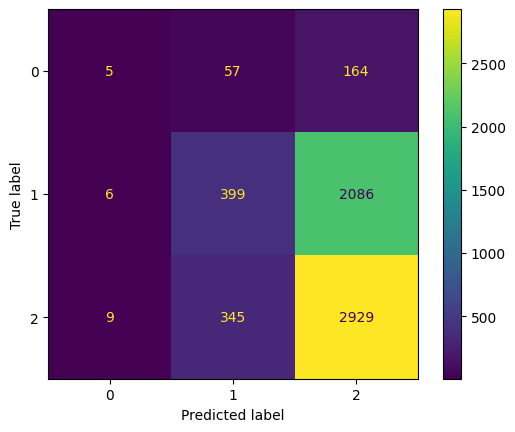

In [21]:
# fit a logistic regression classifier on the training data use default settings
lr_clf = LogisticRegression()
lr_clf.fit(x_train, y_train)

# make prediction on testing data
y_pred_test_lr = lr_clf.predict(x_test)
y_predprob_lr = lr_clf.predict_proba(x_test)
matrix_lr = confusion_matrix(y_test,y_pred_test_lr)
print(classification_report(y_test, y_pred_test_lr))
print("\nAccuracy for Logistic Regression model:",metrics.accuracy_score(y_test, y_pred_test_lr))
print("\n")
y_predict = lr_clf.predict(x_test)
matrix_display = ConfusionMatrixDisplay(matrix_lr).plot()

#### Naive Bayes classifier

##### BernouliNB

A binary algorithm used when the feature is present or not.

                 precision    recall  f1-score   support

medium-stressed       0.00      0.00      0.00       226
   not-stressed       0.46      0.12      0.19      2491
       stressed       0.56      0.91      0.69      3283

       accuracy                           0.55      6000
      macro avg       0.34      0.34      0.29      6000
   weighted avg       0.50      0.55      0.46      6000


Accuracy for Bernouli Naive Bayes model: 0.5488333333333333




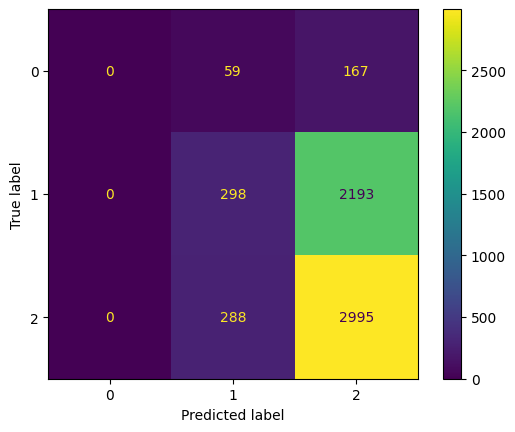

In [22]:
from sklearn.naive_bayes import BernoulliNB
nb_clf = BernoulliNB()
nb_clf.fit(x_train, y_train)
# make prediction on testing data
y_pred_test_nb = nb_clf.predict(x_test)
y_predprob_nb = nb_clf.predict_proba(x_test)
matrix_nb = confusion_matrix(y_test,y_pred_test_nb)
print(classification_report(y_test, y_pred_test_nb))
print("\nAccuracy for Bernouli Naive Bayes model:",metrics.accuracy_score(y_test, y_pred_test_nb))
print("\n")
matrix_display = ConfusionMatrixDisplay(matrix_nb).plot()

##### MultinominaliNB

It consider a feature vector where a given term represents the number of times it appears or very ofen, such as frequency.

                 precision    recall  f1-score   support

medium-stressed       0.19      0.02      0.04       226
   not-stressed       0.52      0.13      0.20      2491
       stressed       0.56      0.92      0.70      3283

       accuracy                           0.56      6000
      macro avg       0.42      0.36      0.31      6000
   weighted avg       0.53      0.56      0.47      6000


Accuracy for multinominal Naive Bayes model: 0.5575




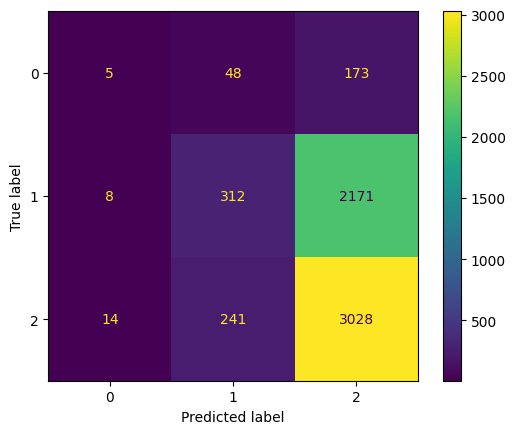

In [23]:
mnb = MultinomialNB()
mnb.fit(x_train, y_train)
# make prediction on testing data
y_pred_test_mnb = mnb.predict(x_test)
y_predprob_mnb = mnb.predict_proba(x_test)
matrix = confusion_matrix(y_test,y_pred_test_mnb)
print(classification_report(y_test, y_pred_test_mnb))
print("\nAccuracy for multinominal Naive Bayes model:",metrics.accuracy_score(y_test, y_pred_test_mnb))
print("\n")

y_predict = mnb.predict(x_test)
cm = confusion_matrix(y_test, y_predict)
cm_display = ConfusionMatrixDisplay(cm).plot()


# Cross validataion

In [24]:
acc_score_lr = metrics.accuracy_score(y_pred_test_lr,y_test)
prec_score_lr = precision_score(y_test,y_pred_test_lr, average='macro')
recall_lr = recall_score(y_test, y_pred_test_lr,average='macro')
f1_lr = f1_score(y_test,y_pred_test_nb,average='macro')
matrix_lr = confusion_matrix(y_test,y_pred_test_lr)
print('Logistic Regression Model\n')
print(str('Accuracy: '+'{:04.2f}'.format(acc_score_lr*100))+'%')
print(str('Precision: '+'{:04.2f}'.format(prec_score_lr*100))+'%')
print(str('Recall: '+'{:04.2f}'.format(recall_lr*100))+'%')
print('F1 Score: ',f1_lr)
print(matrix_lr)

Logistic Regression Model

Accuracy: 55.55%
Precision: 43.79%
Recall: 35.82%
F1 Score:  0.29449952590436496
[[   5   57  164]
 [   6  399 2086]
 [   9  345 2929]]


##### BernouliNB

In [25]:
acc_score_nb = metrics.accuracy_score(y_pred_test_nb,y_test)
prec_score_nb = precision_score(y_test,y_pred_test_nb, average='macro')
recall_nb = recall_score(y_test, y_pred_test_nb,average='macro')
f1_nb = f1_score(y_test,y_pred_test_nb,average='macro')
matrix_nb = confusion_matrix(y_test,y_pred_test_nb)
print('Bernouli Naive Bayes Model\n')
print(str('Accuracy: '+'{:04.2f}'.format(acc_score_nb*100))+'%')
print(str('Precision: '+'{:04.2f}'.format(prec_score_nb*100))+'%')
print(str('Recall: '+'{:04.2f}'.format(recall_nb*100))+'%')
print('F1 Score: ',f1_nb)
print(matrix_nb)

Bernouli Naive Bayes Model

Accuracy: 54.88%
Precision: 34.04%
Recall: 34.40%
F1 Score:  0.29449952590436496
[[   0   59  167]
 [   0  298 2193]
 [   0  288 2995]]


##### MultinominaliNB

In [26]:
acc_score_mnb = metrics.accuracy_score(y_pred_test_mnb,y_test)
prec_score_mnb = precision_score(y_test,y_pred_test_mnb, average='macro')
recall_mnb = recall_score(y_test, y_pred_test_mnb,average='macro')
f1_mnb = f1_score(y_test,y_pred_test_mnb,average='macro')
matrix_mnb = confusion_matrix(y_test,y_pred_test_mnb)
print('Multimominal Naive Bayes Model\n')
print(str('Accuracy: '+'{:04.2f}'.format(acc_score_mnb*100))+'%')
print(str('Precision: '+'{:04.2f}'.format(prec_score_mnb*100))+'%')
print(str('Recall: '+'{:04.2f}'.format(recall_mnb*100))+'%')
print('F1 Score: ',f1_mnb)
print(matrix_mnb)

Multimominal Naive Bayes Model

Accuracy: 55.75%
Precision: 42.27%
Recall: 35.66%
F1 Score:  0.31368265560307407
[[   5   48  173]
 [   8  312 2171]
 [  14  241 3028]]


# Explain the model prediction

Multimominal Naive Bayes Model has higher accuracy than Bernouli Naive Bayes Model.

In [27]:
test_data = df_reidx.iloc[test_idx]
test_data['pred_label'] = y_pred_test_lr
test_data.head()[['sentence','label','pred_label']]
# shows what the prediction label fit to the real label

,sentence,label,pred_label
10650,i noticed several months ago that i d start fe...,stressed,stressed
2041,i love lots of different kinds of sports and l...,not-stressed,not-stressed
8668,i feel even if he killed himself it was becaus...,stressed,not-stressed
1114,i feel numb the way a wound does before it rea...,stressed,stressed
13902,i was quite the outsider due to my british men...,stressed,stressed


In [28]:
# shows what the prediction label does not fit to the real label
test_data[test_data['label'] != test_data['pred_label']].head()[['sentence','label','pred_label']].head()

,sentence,label,pred_label
8668,i feel even if he killed himself it was becaus...,stressed,not-stressed
19770,i woke up feeling artistic ish,not-stressed,stressed
8115,i was feeling wednesday night so i wasn t thri...,not-stressed,stressed
3525,i don t always feel joyful and i quite often t...,not-stressed,stressed
7879,i want to feel happy,not-stressed,stressed


##### Predicted features of logistic regression model

In [29]:
feature_to_coef = {word: float("%.3f" % coef) for word, coef in zip(vectorizer.get_feature_names_out(), lr_clf.coef_[0])}

print("Top positive features:")
sorted(feature_to_coef.items(), key=lambda x: x[1], reverse=True)[:10]


Top positive features:


[('z', 1.078),
 ('q', 0.111),
 ('v', -0.058),
 ('b', -0.09),
 ('x', -0.15),
 ('j', -0.201)]

In [30]:
# Create the feature_to_coef dictionary
feature_to_coef = {word: float("%.3f" % coef) for word, coef in zip(vectorizer.get_feature_names_out(), lr_clf.coef_[0])}

# Print top negative features
print("Top negative features:")
sorted_negative_features = sorted(feature_to_coef.items(), key=lambda x: x[1], reverse=False)[:10]
for feature in sorted_negative_features:
    print(feature)


Top negative features:
('j', -0.201)
('x', -0.15)
('b', -0.09)
('v', -0.058)
('q', 0.111)
('z', 1.078)


##### Predicted features of BernouliNB

In [31]:
# Create the feature_to_coef dictionary for the positive class (usually class 1 in binary classification)
feature_to_coef = {word: abs(float("%.3f" % coef)) for word, coef in zip(vectorizer.get_feature_names_out(), nb_clf.feature_log_prob_[1])}

# Print top positive features
print("Top positive features:")
sorted_positive_features = sorted(feature_to_coef.items(), key=lambda x: x[1], reverse=True)[:10]
for feature in sorted_positive_features:
    print(feature)


Top positive features:
('q', 3.061)
('z', 2.935)
('j', 2.56)
('x', 2.212)
('b', 0.845)
('v', 0.752)


In [32]:
# most of the words are reliable evidence of indicating negative sentiments
print("Top negative features:")
sorted(feature_to_coef.items(), key=lambda x: x[1], reverse=False)[:10]

Top negative features:


[('v', 0.752),
 ('b', 0.845),
 ('x', 2.212),
 ('j', 2.56),
 ('z', 2.935),
 ('q', 3.061)]

##### Predicted features of multinomial NB

In [33]:
import math

# If you're working with binary classification, index 1 is usually the positive class
feature_to_coef = {word: float("%.3f" % math.exp(coef)) for word, coef in zip(vectorizer.get_feature_names_out(), mnb.feature_log_prob_[1])}

# Print top positive features
print("Top positive features:")
sorted_positive_features = sorted(feature_to_coef.items(), key=lambda x: x[1], reverse=True)[:10]
for feature in sorted_positive_features:
    print(feature)

Top positive features:
('v', 0.411)
('b', 0.396)
('x', 0.075)
('j', 0.052)
('z', 0.036)
('q', 0.03)


In [34]:
# most of the words are reliable evidence of indicating negative sentiments
print("Top negative features:")
sorted(feature_to_coef.items(), key=lambda x: x[1], reverse=False)[:10]

Top negative features:


[('q', 0.03),
 ('z', 0.036),
 ('j', 0.052),
 ('x', 0.075),
 ('b', 0.396),
 ('v', 0.411)]

In [35]:
text=['i am not feeling well', 'i want to make this project better', 'i feel aaaaaaah', 'i feel like a bit of a strange one', 'i feel overwhelmed']
test_result = lr_clf.predict(vectorizer.transform(text))
print(test_result)

['stressed' 'stressed' 'stressed' 'stressed' 'stressed']


POS

In [37]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Specify the path to your text file
file_path = 'val.txt'

# Read the content of the text file
with open(file_path, 'r', encoding='utf-8') as file:
    text = file.read()

# Tokenize the text into words
words = word_tokenize(text)

# Perform POS tagging
pos_tags = nltk.pos_tag(words)

# Print the POS tags
print(pos_tags)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


[('im', 'NN'), ('feeling', 'VBG'), ('quite', 'RB'), ('sad', 'JJ'), ('and', 'CC'), ('sorry', 'NN'), ('for', 'IN'), ('myself', 'PRP'), ('but', 'CC'), ('ill', 'VB'), ('snap', 'VBZ'), ('out', 'IN'), ('of', 'IN'), ('it', 'PRP'), ('soon', 'RB'), (';', ':'), ('sadness', 'NN'), ('i', 'VBP'), ('feel', 'VBP'), ('like', 'IN'), ('i', 'NN'), ('am', 'VBP'), ('still', 'RB'), ('looking', 'VBG'), ('at', 'IN'), ('a', 'DT'), ('blank', 'JJ'), ('canvas', 'NN'), ('blank', 'NN'), ('pieces', 'NNS'), ('of', 'IN'), ('paper', 'NN'), (';', ':'), ('sadness', 'CC'), ('i', 'VB'), ('feel', 'VBP'), ('like', 'IN'), ('a', 'DT'), ('faithful', 'JJ'), ('servant', 'NN'), (';', ':'), ('love', 'CC'), ('i', 'VB'), ('am', 'VBP'), ('just', 'RB'), ('feeling', 'VBG'), ('cranky', 'NN'), ('and', 'CC'), ('blue', 'NN'), (';', ':'), ('anger', 'CC'), ('i', 'VB'), ('can', 'MD'), ('have', 'VB'), ('for', 'IN'), ('a', 'DT'), ('treat', 'NN'), ('or', 'CC'), ('if', 'IN'), ('i', 'JJ'), ('am', 'VBP'), ('feeling', 'VBG'), ('festive', 'NN'), (';',

In [38]:
# Specify the path to your text file
file_path = 'val.txt'

# Define a function to generate N-grams
def generate_ngrams(text, n):
    words = text.split()  # Split the text into words
    ngrams = zip(*[words[i:] for i in range(n)])  # Create N-grams
    return [' '.join(ngram) for ngram in ngrams]

# Read the content of the text file
with open(file_path, 'r', encoding='utf-8') as file:
    text = file.read()

# Specify the desired value of N (e.g., 2 for bigrams, 3 for trigrams)
n = 2  # Change this to the desired N-gram value

# Generate and print N-grams
ngrams = generate_ngrams(text, n)
for ngram in ngrams:
    print(ngram)


im feeling
feeling quite
quite sad
sad and
and sorry
sorry for
for myself
myself but
but ill
ill snap
snap out
out of
of it
it soon;sadness
soon;sadness i
i feel
feel like
like i
i am
am still
still looking
looking at
at a
a blank
blank canvas
canvas blank
blank pieces
pieces of
of paper;sadness
paper;sadness i
i feel
feel like
like a
a faithful
faithful servant;love
servant;love i
i am
am just
just feeling
feeling cranky
cranky and
and blue;anger
blue;anger i
i can
can have
have for
for a
a treat
treat or
or if
if i
i am
am feeling
feeling festive;joy
festive;joy i
i start
start to
to feel
feel more
more appreciative
appreciative of
of what
what god
god has
has done
done for
for me;joy
me;joy i
i am
am feeling
feeling more
more confident
confident that
that we
we will
will be
be able
able to
to take
take care
care of
of this
this baby;joy
baby;joy i
i feel
feel incredibly
incredibly lucky
lucky just
just to
to be
be able
able to
to talk
talk to
to her;joy
her;joy i
i feel
feel less
le

In [39]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

# Download necessary NLTK data
nltk.download('punkt')

# Path to the file
file_path = "val.txt"

# Read the file
with open(file_path, 'r') as file:
    text = file.read()

# Tokenize the text into sentences and words
sentences = sent_tokenize(text)
words = word_tokenize(text)

# Print sentences and words for comparison
print("Sentences:")
for i, sentence in enumerate(sentences):
    print(f"Sentence {i+1}: {sentence}")

print("\nWords:")
for i, word in enumerate(words):
    print(f"Word {i+1}: {word}")

Sentences:
Sentence 1: im feeling quite sad and sorry for myself but ill snap out of it soon;sadness
i feel like i am still looking at a blank canvas blank pieces of paper;sadness
i feel like a faithful servant;love
i am just feeling cranky and blue;anger
i can have for a treat or if i am feeling festive;joy
i start to feel more appreciative of what god has done for me;joy
i am feeling more confident that we will be able to take care of this baby;joy
i feel incredibly lucky just to be able to talk to her;joy
i feel less keen about the army every day;joy
i feel dirty and ashamed for saying that;sadness
i feel bitchy but not defeated yet;anger
i was dribbling on mums coffee table looking out of the window and feeling very happy;joy
i woke up often got up around am feeling pukey radiation and groggy;sadness
i was feeling sentimental;sadness
i walked out of there an hour and fifteen minutes later feeling like i had been beaten with a stick and then placed on the rack and stretched;sadness


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [40]:
import nltk
from nltk.tokenize import sent_tokenize

# Download necessary NLTK data
nltk.download('punkt')

# Path to the file
file_path = "val.txt"

# Read the file
with open(file_path, 'r') as file:
    text = file.read()

# Tokenize the text into sentences
sentences = sent_tokenize(text)

# Print the original text
print("Original Text:")
print(text)

# Print tokenized sentences for comparison
print("\nTokenized Sentences:")
for i, sentence in enumerate(sentences):
    print(f"Sentence {i+1}: {sentence}")


Original Text:
im feeling quite sad and sorry for myself but ill snap out of it soon;sadness
i feel like i am still looking at a blank canvas blank pieces of paper;sadness
i feel like a faithful servant;love
i am just feeling cranky and blue;anger
i can have for a treat or if i am feeling festive;joy
i start to feel more appreciative of what god has done for me;joy
i am feeling more confident that we will be able to take care of this baby;joy
i feel incredibly lucky just to be able to talk to her;joy
i feel less keen about the army every day;joy
i feel dirty and ashamed for saying that;sadness
i feel bitchy but not defeated yet;anger
i was dribbling on mums coffee table looking out of the window and feeling very happy;joy
i woke up often got up around am feeling pukey radiation and groggy;sadness
i was feeling sentimental;sadness
i walked out of there an hour and fifteen minutes later feeling like i had been beaten with a stick and then placed on the rack and stretched;sadness
i never 

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\medoh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [42]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

# Load the tokenizer and model from Hugging Face
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModelForSequenceClassification.from_pretrained("bert-base-uncased")

# Path to the file
file_path = "val.txt"

# Read the file and process its content
with open(file_path, "r") as file:
    text = file.read()

# Tokenize the text and prepare input for the model
inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=512)

# Get predictions from the model
outputs = model(**inputs)

# Convert logits to probabilities (optional)
probabilities = torch.nn.functional.softmax(outputs.logits, dim=1)

# Print the results
print("Logits:", outputs.logits)
print("Probabilities:", probabilities)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Logits: tensor([[ 0.2234, -0.0550]], grad_fn=<AddmmBackward0>)
Probabilities: tensor([[0.5692, 0.4308]], grad_fn=<SoftmaxBackward0>)
